In [512]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [513]:

from ucimlrepo import fetch_ucirepo 
  
# fetch dataset 
bank_marketing = fetch_ucirepo(id=222) 
  
# data (as pandas dataframes) 
X = bank_marketing.data.features 
y = bank_marketing.data.targets 
  
# metadata 
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 16 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   age          45211 non-null  int64 
 1   job          44923 non-null  object
 2   marital      45211 non-null  object
 3   education    43354 non-null  object
 4   default      45211 non-null  object
 5   balance      45211 non-null  int64 
 6   housing      45211 non-null  object
 7   loan         45211 non-null  object
 8   contact      32191 non-null  object
 9   day_of_week  45211 non-null  int64 
 10  month        45211 non-null  object
 11  duration     45211 non-null  int64 
 12  campaign     45211 non-null  int64 
 13  pdays        45211 non-null  int64 
 14  previous     45211 non-null  int64 
 15  poutcome     8252 non-null   object
dtypes: int64(7), object(9)
memory usage: 5.5+ MB


In [514]:
y.shape

(45211, 1)

In [515]:
y.value_counts()

y  
no     39922
yes     5289
Name: count, dtype: int64

In [516]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 16 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   age          45211 non-null  int64 
 1   job          44923 non-null  object
 2   marital      45211 non-null  object
 3   education    43354 non-null  object
 4   default      45211 non-null  object
 5   balance      45211 non-null  int64 
 6   housing      45211 non-null  object
 7   loan         45211 non-null  object
 8   contact      32191 non-null  object
 9   day_of_week  45211 non-null  int64 
 10  month        45211 non-null  object
 11  duration     45211 non-null  int64 
 12  campaign     45211 non-null  int64 
 13  pdays        45211 non-null  int64 
 14  previous     45211 non-null  int64 
 15  poutcome     8252 non-null   object
dtypes: int64(7), object(9)
memory usage: 5.5+ MB


In [517]:
df=pd.concat([X,y],axis=1)
df

,age,job,marital,education,default,balance,housing,loan,contact,day_of_week,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,NaN,5,may,261,1,-1,0,NaN,no
1,44,technician,single,secondary,no,29,yes,no,NaN,5,may,151,1,-1,0,NaN,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,NaN,5,may,76,1,-1,0,NaN,no
3,47,blue-collar,married,NaN,no,1506,yes,no,NaN,5,may,92,1,-1,0,NaN,no
4,33,NaN,single,NaN,no,1,no,no,NaN,5,may,198,1,-1,0,NaN,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,NaN,yes
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,NaN,yes
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,NaN,no


In [518]:
df["poutcome"].isnull().sum()

36959

In [519]:
df.isnull().sum()

age                0
job              288
marital            0
education       1857
default            0
balance            0
housing            0
loan               0
contact        13020
day_of_week        0
month              0
duration           0
campaign           0
pdays              0
previous           0
poutcome       36959
y                  0
dtype: int64

In [520]:
df.drop(columns=["contact"],inplace=True)

In [521]:
df["poutcome"].value_counts()

poutcome
failure    4901
other      1840
success    1511
Name: count, dtype: int64

In [522]:
df["poutcome"].fillna("other", inplace = True)

C:\Users\Asus\AppData\Local\Temp\ipykernel_22260\1638930309.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df["poutcome"].fillna("other", inplace = True)


In [523]:
df["poutcome"].value_counts()

poutcome
other      38799
failure     4901
success     1511
Name: count, dtype: int64

In [524]:
df.isna().sum()

age               0
job             288
marital           0
education      1857
default           0
balance           0
housing           0
loan              0
day_of_week       0
month             0
duration          0
campaign          0
pdays             0
previous          0
poutcome          0
y                 0
dtype: int64

In [525]:
df1= df.dropna(axis=0,how='any')

In [526]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 43193 entries, 0 to 45210
Data columns (total 16 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   age          43193 non-null  int64 
 1   job          43193 non-null  object
 2   marital      43193 non-null  object
 3   education    43193 non-null  object
 4   default      43193 non-null  object
 5   balance      43193 non-null  int64 
 6   housing      43193 non-null  object
 7   loan         43193 non-null  object
 8   day_of_week  43193 non-null  int64 
 9   month        43193 non-null  object
 10  duration     43193 non-null  int64 
 11  campaign     43193 non-null  int64 
 12  pdays        43193 non-null  int64 
 13  previous     43193 non-null  int64 
 14  poutcome     43193 non-null  object
 15  y            43193 non-null  object
dtypes: int64(7), object(9)
memory usage: 5.6+ MB


In [527]:
df1.head()

,age,job,marital,education,default,balance,housing,loan,day_of_week,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,5,may,261,1,-1,0,other,no
1,44,technician,single,secondary,no,29,yes,no,5,may,151,1,-1,0,other,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,5,may,76,1,-1,0,other,no
5,35,management,married,tertiary,no,231,yes,no,5,may,139,1,-1,0,other,no
6,28,management,single,tertiary,no,447,yes,yes,5,may,217,1,-1,0,other,no


In [528]:
df1.describe()

,age,balance,day_of_week,duration,campaign,pdays,previous
count,43193.000000,43193.000000,43193.000000,43193.000000,43193.000000,43193.000000,43193.000000
mean,40.764082,1354.027342,15.809414,258.323409,2.758178,40.404070,0.584863
std,10.512640,3042.103625,8.305970,258.162006,3.063987,100.420624,2.332672
min,18.000000,-8019.000000,1.000000,0.000000,1.000000,-1.000000,0.000000
25%,33.000000,71.000000,8.000000,103.000000,1.000000,-1.000000,0.000000
50%,39.000000,442.000000,16.000000,180.000000,2.000000,-1.000000,0.000000
75%,48.000000,1412.000000,21.000000,318.000000,3.000000,-1.000000,0.000000
max,95.000000,102127.000000,31.000000,4918.000000,58.000000,871.000000,275.000000


In [529]:
df1[df1['duration']==0].value_counts()

age  job           marital  education  default  balance  housing  loan  day_of_week  month  duration  campaign  pdays  previous  poutcome  y 
31   entrepreneur  married  secondary  no       162      yes      yes   11           may    0         2         -1     0         other     no    1
35   technician    married  secondary  no       5535     no       no    26           aug    0         15        -1     0         other     no    1
53   management    married  primary    no       351      yes      no    27           may    0         4         -1     0         other     no    1
Name: count, dtype: int64

In [530]:
df1[df1['y']=='yes'].shape  

(5021, 16)

In [531]:
#to check how many yes in month of may
df1[(df1['month']=='may') & (df1['y']=='yes')].shape

(888, 16)

<Axes: xlabel='month'>

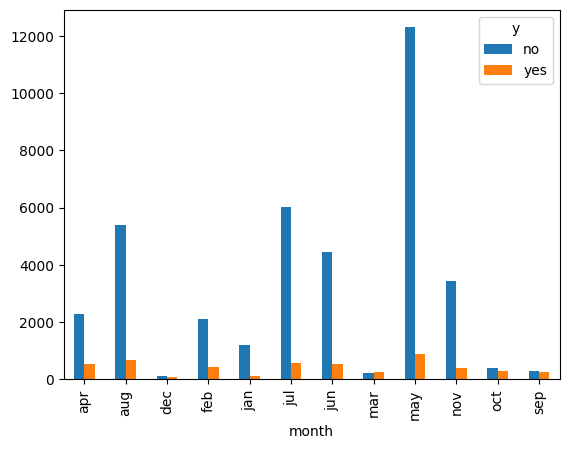

In [532]:
#checking the number of yes per month
df1.groupby('month')['y'].value_counts().unstack().plot(kind='bar')

In [533]:
df1.drop(columns=["day_of_week","month"],inplace=True)

C:\Users\Asus\AppData\Local\Temp\ipykernel_22260\2100313181.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1.drop(columns=["day_of_week","month"],inplace=True)


In [534]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 43193 entries, 0 to 45210
Data columns (total 14 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        43193 non-null  int64 
 1   job        43193 non-null  object
 2   marital    43193 non-null  object
 3   education  43193 non-null  object
 4   default    43193 non-null  object
 5   balance    43193 non-null  int64 
 6   housing    43193 non-null  object
 7   loan       43193 non-null  object
 8   duration   43193 non-null  int64 
 9   campaign   43193 non-null  int64 
 10  pdays      43193 non-null  int64 
 11  previous   43193 non-null  int64 
 12  poutcome   43193 non-null  object
 13  y          43193 non-null  object
dtypes: int64(6), object(8)
memory usage: 4.9+ MB


In [535]:
## i want to check the average balace of each category of job
df1.groupby('job')['balance'].mean()

job
admin.           1119.939200
blue-collar      1080.684954
entrepreneur     1519.729270
housemaid        1334.142259
management       1767.004883
retired          2010.909091
self-employed    1649.973377
services          971.407343
student          1369.760000
technician       1235.993746
unemployed       1521.730769
Name: balance, dtype: float64

In [536]:
poutcome_mapping={'failure':-1,'success':1,'other':0}
df1["poutcome_encoded"]=df1["poutcome"].map(poutcome_mapping)

education_mapping={'primary':0,'secondary':1,'tertiary':2}
df1["education_encoded"]=df1["education"].map(education_mapping)



C:\Users\Asus\AppData\Local\Temp\ipykernel_22260\3869134681.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1["poutcome_encoded"]=df1["poutcome"].map(poutcome_mapping)
C:\Users\Asus\AppData\Local\Temp\ipykernel_22260\3869134681.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1["education_encoded"]=df1["education"].map(education_mapping)


In [537]:
df1

,age,job,marital,education,default,balance,housing,loan,duration,campaign,pdays,previous,poutcome,y,poutcome_encoded,education_encoded
0,58,management,married,tertiary,no,2143,yes,no,261,1,-1,0,other,no,0,2
1,44,technician,single,secondary,no,29,yes,no,151,1,-1,0,other,no,0,1
2,33,entrepreneur,married,secondary,no,2,yes,yes,76,1,-1,0,other,no,0,1
5,35,management,married,tertiary,no,231,yes,no,139,1,-1,0,other,no,0,2
6,28,management,single,tertiary,no,447,yes,yes,217,1,-1,0,other,no,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,977,3,-1,0,other,yes,0,2
45207,71,retired,divorced,primary,no,1729,no,no,456,2,-1,0,other,yes,0,0
45208,72,retired,married,secondary,no,5715,no,no,1127,5,184,3,success,yes,1,1
45209,57,blue-collar,married,secondary,no,668,no,no,508,4,-1,0,other,no,0,1


In [538]:
df1.drop(columns=["poutcome","education"],inplace=True)


C:\Users\Asus\AppData\Local\Temp\ipykernel_22260\473701777.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1.drop(columns=["poutcome","education"],inplace=True)


In [539]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 43193 entries, 0 to 45210
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   age                43193 non-null  int64 
 1   job                43193 non-null  object
 2   marital            43193 non-null  object
 3   default            43193 non-null  object
 4   balance            43193 non-null  int64 
 5   housing            43193 non-null  object
 6   loan               43193 non-null  object
 7   duration           43193 non-null  int64 
 8   campaign           43193 non-null  int64 
 9   pdays              43193 non-null  int64 
 10  previous           43193 non-null  int64 
 11  y                  43193 non-null  object
 12  poutcome_encoded   43193 non-null  int64 
 13  education_encoded  43193 non-null  int64 
dtypes: int64(8), object(6)
memory usage: 4.9+ MB


In [540]:
df2=pd.get_dummies(df1,columns=['marital','housing','loan','job','default'],dtype=int)
df2


,age,balance,duration,campaign,pdays,previous,y,poutcome_encoded,education_encoded,marital_divorced,...,job_housemaid,job_management,job_retired,job_self-employed,job_services,job_student,job_technician,job_unemployed,default_no,default_yes
0,58,2143,261,1,-1,0,no,0,2,0,...,0,1,0,0,0,0,0,0,1,0
1,44,29,151,1,-1,0,no,0,1,0,...,0,0,0,0,0,0,1,0,1,0
2,33,2,76,1,-1,0,no,0,1,0,...,0,0,0,0,0,0,0,0,1,0
5,35,231,139,1,-1,0,no,0,2,0,...,0,1,0,0,0,0,0,0,1,0
6,28,447,217,1,-1,0,no,0,2,0,...,0,1,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,825,977,3,-1,0,yes,0,2,0,...,0,0,0,0,0,0,1,0,1,0
45207,71,1729,456,2,-1,0,yes,0,0,1,...,0,0,1,0,0,0,0,0,1,0
45208,72,5715,1127,5,184,3,yes,1,1,0,...,0,0,1,0,0,0,0,0,1,0
45209,57,668,508,4,-1,0,no,0,1,0,...,0,0,0,0,0,0,0,0,1,0


In [541]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 43193 entries, 0 to 45210
Data columns (total 29 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   age                43193 non-null  int64 
 1   balance            43193 non-null  int64 
 2   duration           43193 non-null  int64 
 3   campaign           43193 non-null  int64 
 4   pdays              43193 non-null  int64 
 5   previous           43193 non-null  int64 
 6   y                  43193 non-null  object
 7   poutcome_encoded   43193 non-null  int64 
 8   education_encoded  43193 non-null  int64 
 9   marital_divorced   43193 non-null  int32 
 10  marital_married    43193 non-null  int32 
 11  marital_single     43193 non-null  int32 
 12  housing_no         43193 non-null  int32 
 13  housing_yes        43193 non-null  int32 
 14  loan_no            43193 non-null  int32 
 15  loan_yes           43193 non-null  int32 
 16  job_admin.         43193 non-null  int32 
 17

In [542]:
X=df2.drop(columns=["y"])
y=df2["y"]


<Axes: xlabel='y'>

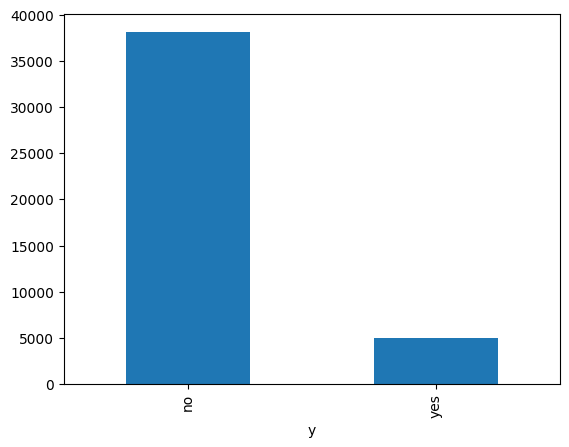

In [543]:
y.value_counts().plot(kind='bar')

In [544]:
y.value_counts()

y
no     38172
yes     5021
Name: count, dtype: int64

In [545]:
RANDOM_STATE=10

In [546]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,stratify=y,random_state=RANDOM_STATE)

In [547]:
X_train.shape

(34554, 28)

In [548]:
X_test.shape

(8639, 28)

In [549]:
from sklearn.tree import DecisionTreeClassifier
dtc=DecisionTreeClassifier(random_state=RANDOM_STATE,criterion='gini')
dtc.fit(X_train,y_train)



DecisionTreeClassifier(random_state=10)

In [550]:
y_pred=dtc.predict(X_test)

In [551]:
from sklearn.metrics import f1_score,confusion_matrix
con_mat=confusion_matrix(y_test,y_pred)
print("The confusion matrix \n ",con_mat)

The confusion matrix 
  [[7042  593]
 [ 578  426]]


In [552]:
y_pred_train = dtc.predict(X_train)
train_f1_score = f1_score( y_pred_train,y_train,average="weighted")
y_pred = dtc.predict(X_test)
test_f1_score =f1_score(y_test, y_pred,average ="weighted")

In [553]:
print("Train f1-score = {} and Test f1-score = {}".format(round(train_f1_score, 2), round(test_f1_score, 2)))
print("The depth of our tree is {}".format(dtc.get_depth()))

Train f1-score = 1.0 and Test f1-score = 0.86
The depth of our tree is 35


Text(50.722222222222214, 0.5, 'Actual')

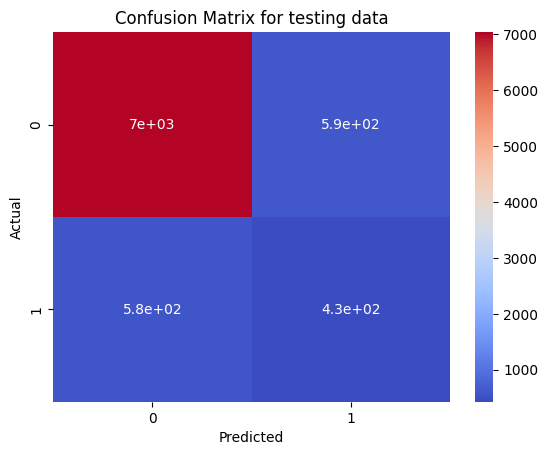

In [560]:
sns.heatmap(con_mat,cmap='coolwarm',annot=True)
plt.title("Confusion Matrix for testing data")
plt.xlabel("Predicted")
plt.ylabel("Actual")

[Text(0.7237171021216678, 0.9861111111111112, 'duration <= 521.5\ngini = 0.205\nsamples = 34554\nvalue = [30537, 4017]\nclass = no'),
 Text(0.5381840053651917, 0.9583333333333334, 'poutcome_encoded <= 0.5\ngini = 0.141\nsamples = 30703\nvalue = [28367, 2336]\nclass = no'),
 Text(0.36487148236706757, 0.9305555555555556, 'duration <= 205.5\ngini = 0.11\nsamples = 29748\nvalue = [28005, 1743]\nclass = no'),
 Text(0.17487529383625544, 0.9027777777777778, 'age <= 60.5\ngini = 0.053\nsamples = 18980\nvalue = [18462, 518]\nclass = no'),
 Text(0.09930860082603941, 0.875, 'duration <= 109.5\ngini = 0.047\nsamples = 18640\nvalue = [18188, 452]\nclass = no'),
 Text(0.03297198500372629, 0.8472222222222222, 'pdays <= 383.0\ngini = 0.017\nsamples = 9109\nvalue = [9032, 77]\nclass = no'),
 Text(0.014447742535182153, 0.8194444444444444, 'age <= 24.5\ngini = 0.016\nsamples = 9072\nvalue = [9001, 71]\nclass = no'),
 Text(0.0023064913588171617, 0.7916666666666666, 'duration <= 91.0\ngini = 0.132\nsamples

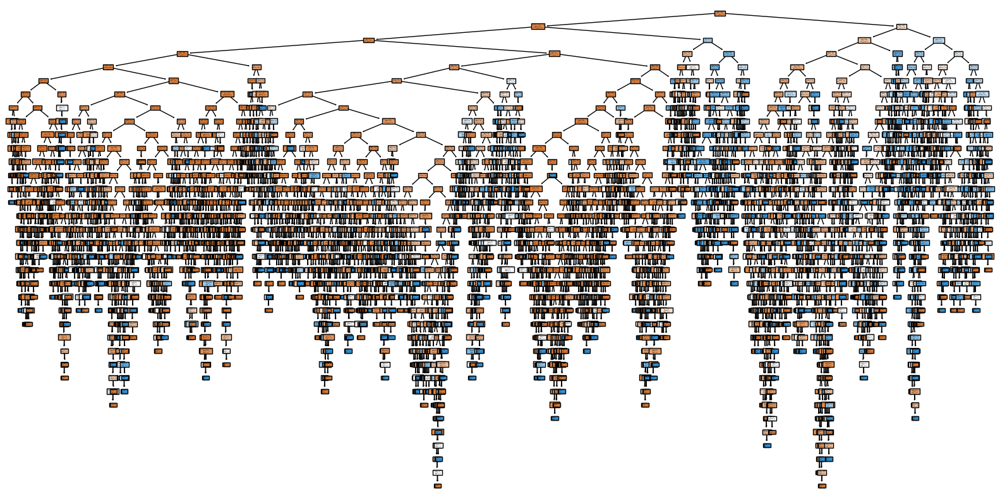

In [555]:
from sklearn.tree import plot_tree

plt.figure(figsize=(20,10))
plot_tree(dtc,feature_names=X_train.columns,class_names=['no','yes'],filled=True)

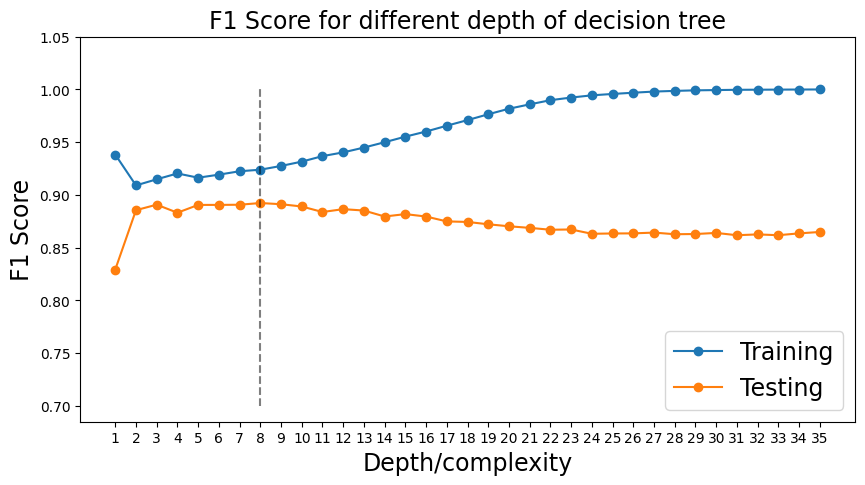

In [556]:
import matplotlib.pyplot as plt
%matplotlib inline


train_scores = []
test_socres = []
for i in range(1, dtc.get_depth()+1):
    model = DecisionTreeClassifier(random_state=RANDOM_STATE, max_depth=i).fit(X_train, y_train)

    # Computing f1_score in train set
    y_pred_train = model.predict(X_train)
    train_scores.append(f1_score(y_pred_train, y_train, average='weighted'))# f1_score on train set

    # Computing f1_score on test set
    y_pred = model.predict(X_test) # Making Predictions
    test_socres.append(f1_score(y_test, y_pred, average='weighted'))

max_test_score = np.argmax(test_socres) + 1
# Plot of depth vs accuracy
depth = dtc.get_depth()
plt.figure(figsize = (10,5))
plt.plot(np.arange(1, depth+1, 1), train_scores, marker = 'o', label = 'Training')
plt.plot(np.arange(1, depth+1, 1), test_socres, marker = 'o', label = "Testing")
plt.plot([max_test_score,max_test_score], [0.7, 1.0], '--', color = 'black', alpha = 0.5)
plt.xlabel("Depth/complexity", fontsize = 17)
plt.ylabel("F1 Score", fontsize = 17)
plt.title("F1 Score for different depth of decision tree", fontsize = 17)
plt.xticks(np.arange(1, depth+1, 1))
plt.yticks(np.arange(0.7, 1.05, 0.05))
plt.legend(fontsize = 17)
plt.show()

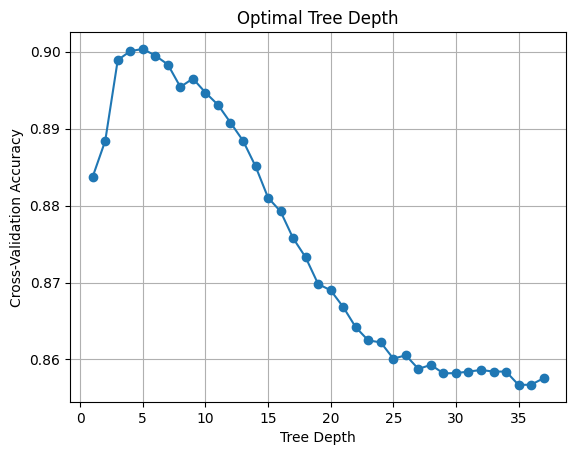

Optimal Depth: 5


In [557]:
from sklearn.model_selection import cross_val_score
max_depths = range(1, 38)

cv_scores = []

for depth in max_depths:
    model = DecisionTreeClassifier(criterion='entropy', max_depth=depth)
    scores = cross_val_score(model, X_train, y_train, cv=5)  # 5-fold cross-validation
    cv_scores.append(np.mean(scores))

plt.plot(max_depths, cv_scores, marker='o')
plt.xlabel('Tree Depth')
plt.ylabel('Cross-Validation Accuracy')
plt.title('Optimal Tree Depth')
plt.grid()
plt.show()

optimal_depth = max_depths[np.argmax(cv_scores)]
print(f"Optimal Depth: {optimal_depth}")


In [565]:
model_1 = DecisionTreeClassifier(random_state=RANDOM_STATE, max_depth=8).fit(X_train,y_train)

y_pred =  model_1.predict(X_train)# Array to store predictions
pred_f1_score = f1_score(y_train,y_pred,average ="weighted")
y_pred_test = model_1.predict(X_test)
test_f1_score = f1_score(y_test, y_pred_test,average ="weighted")

print("Train f1-score = {} and Test f1-score = {}".format(round(train_f1_score, 2), round(test_f1_score, 5)))
print("The depth of our tree is {}".format(model_1.get_depth()))

Train f1-score = 1.0 and Test f1-score = 0.89233
The depth of our tree is 8


In [581]:
plt.figure(figsize=(400,80))
plot_tree(model_1,feature_names=X_train.columns,class_names=['no','yes'],filled=True,fontsize=20)

[Text(0.5263059701492537, 0.9444444444444444, 'duration <= 521.5\ngini = 0.205\nsamples = 34554\nvalue = [30537, 4017]\nclass = no'),
 Text(0.2871268656716418, 0.8333333333333334, 'poutcome_encoded <= 0.5\ngini = 0.141\nsamples = 30703\nvalue = [28367, 2336]\nclass = no'),
 Text(0.14944029850746268, 0.7222222222222222, 'duration <= 205.5\ngini = 0.11\nsamples = 29748\nvalue = [28005, 1743]\nclass = no'),
 Text(0.07611940298507462, 0.6111111111111112, 'age <= 60.5\ngini = 0.053\nsamples = 18980\nvalue = [18462, 518]\nclass = no'),
 Text(0.03955223880597015, 0.5, 'duration <= 109.5\ngini = 0.047\nsamples = 18640\nvalue = [18188, 452]\nclass = no'),
 Text(0.019402985074626865, 0.3888888888888889, 'pdays <= 383.0\ngini = 0.017\nsamples = 9109\nvalue = [9032, 77]\nclass = no'),
 Text(0.011940298507462687, 0.2777777777777778, 'age <= 24.5\ngini = 0.016\nsamples = 9072\nvalue = [9001, 71]\nclass = no'),
 Text(0.005970149253731343, 0.16666666666666666, 'duration <= 91.0\ngini = 0.132\nsamples 

In [570]:
model_2 = DecisionTreeClassifier(random_state=RANDOM_STATE, max_depth=5).fit(X_train,y_train)

y_pred =  model_2.predict(X_train)# Array to store predictions
pred_f1_score = f1_score(y_train,y_pred,average ="weighted")
y_pred_test = model_2.predict(X_test)
test_f1_score = f1_score(y_test, y_pred_test,average ="weighted")

print("Train f1-score = {} and Test f1-score = {}".format(round(train_f1_score, 2), round(test_f1_score, 5)))
print("The depth of our tree is {}".format(model_2.get_depth()))

Train f1-score = 1.0 and Test f1-score = 0.89054
The depth of our tree is 5


[Text(0.5, 0.9166666666666666, 'duration <= 521.5\ngini = 0.205\nsamples = 34554\nvalue = [30537, 4017]\nclass = no'),
 Text(0.25, 0.75, 'poutcome_encoded <= 0.5\ngini = 0.141\nsamples = 30703\nvalue = [28367, 2336]\nclass = no'),
 Text(0.125, 0.5833333333333334, 'duration <= 205.5\ngini = 0.11\nsamples = 29748\nvalue = [28005, 1743]\nclass = no'),
 Text(0.0625, 0.4166666666666667, 'age <= 60.5\ngini = 0.053\nsamples = 18980\nvalue = [18462, 518]\nclass = no'),
 Text(0.03125, 0.25, 'duration <= 109.5\ngini = 0.047\nsamples = 18640\nvalue = [18188, 452]\nclass = no'),
 Text(0.015625, 0.08333333333333333, 'gini = 0.017\nsamples = 9109\nvalue = [9032, 77]\nclass = no'),
 Text(0.046875, 0.08333333333333333, 'gini = 0.076\nsamples = 9531\nvalue = [9156, 375]\nclass = no'),
 Text(0.09375, 0.25, 'duration <= 126.0\ngini = 0.313\nsamples = 340\nvalue = [274, 66]\nclass = no'),
 Text(0.078125, 0.08333333333333333, 'gini = 0.137\nsamples = 162\nvalue = [150, 12]\nclass = no'),
 Text(0.109375, 0.

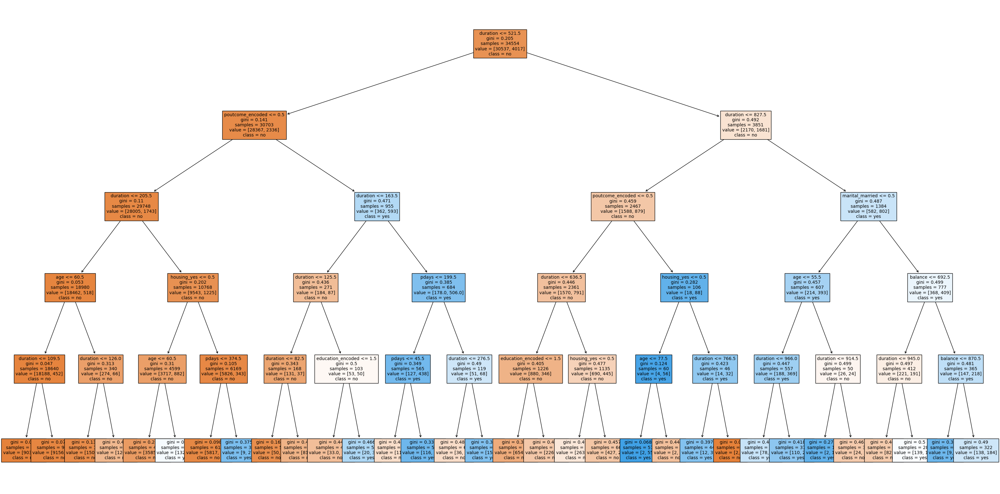

In [574]:
plt.figure(figsize=(40,20))
plot_tree(model_2,feature_names=X_train.columns,class_names=['no','yes'],filled=True,fontsize=10)